# Localisation — head-level cross-attention ablation sweepsReproduces the **Localization** workflow from §3.1 of the DreamReader paper.Scales individual attention heads in cross-attn blocks and shows the effecton generation.Config comes from `t2i_interp/config/localisation/run.yaml`. Equivalent CLI:`t2i-localise model=sd15 target_layer=...`.

In [1]:
# Bootstrap: locate repo root, put on sys.path, chdir there.
# Works whether you launched Jupyter from repo root or from notebooks/.
from pathlib import Path
import os, sys

ROOT = Path.cwd()
while ROOT.parent != ROOT and not (ROOT / "pyproject.toml").exists():
    ROOT = ROOT.parent
if not (ROOT / "pyproject.toml").exists():
    raise RuntimeError("Could not locate repo root (no pyproject.toml found up the tree).")

if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))
os.chdir(ROOT)
print(f"Repo root: {ROOT}")

Repo root: /Users/luka/repos/my/T2I_Interp_toolkit


In [2]:
# Hydra compose: optional model preset + auto-detected device/dtype.
# MODEL_PRESET can be "sd15" / "sdxl" / "sdxl_turbo", or None to use the
# workflow's config-default model_key.
from hydra import compose, initialize_config_dir
from omegaconf import OmegaConf
from t2i_interp.config._hydra_config import config_dir
import torch

MODEL_PRESET = None  # ← change me

if torch.cuda.is_available():
    DEVICE, DTYPE = "cuda:0", "float16"
elif torch.backends.mps.is_available():
    DEVICE, DTYPE = "mps", "bfloat16"
else:
    DEVICE, DTYPE = "cpu", "float32"

overrides = [f"device={DEVICE}", f"dtype={DTYPE}", "wandb.project=null"]
if MODEL_PRESET:
    overrides.append(f"model={MODEL_PRESET}")

with initialize_config_dir(config_dir=config_dir(), version_base=None):
    cfg = compose(config_name="localisation/run", overrides=overrides)
print(OmegaConf.to_yaml(cfg))

wandb:
  project: null
  entity: nirmalendu12345-sutd-singapore-university-of-technology-
  name: null
  tags: []
  sweep_report_type: localise
model_key: CompVis/stable-diffusion-v1-4
device: mps
dtype: bfloat16
target_layer: down_blocks_1_attentions_0_transformer_blocks_0_attn2_out
target_heads: null
max_samples: 1000
factor: 0.0
start_step: 0
end_step: 50
prompt: unicorn
num_inference_steps: 50
guidance_scale: 7.5
seed: 40
output_dir: ./output_images/localisation
metrics:
  clip:
    _target_: t2i_interp.utils.metrics.clip_score.CLIPScorer
  lpips:
    _target_: t2i_interp.utils.metrics.lpips_score.LPIPSScorer
  fid:
    _target_: t2i_interp.utils.metrics.fid_score.FIDScorer



In [3]:
import torch
from tqdm import tqdm
from diffusers import StableDiffusionPipeline

from t2i_interp.t2i import T2IModel
from t2i_interp.utils.inference import Inference, InferenceSpec
from t2i_interp.utils.plot import show_grid
from t2i_interp.utils.T2I.hook import UNetAlterHook

model = T2IModel(
    cfg.model_key,
    automodal=StableDiffusionPipeline,  # explicit text-to-image — default is img2img!
    device=cfg.device,
    dtype=cfg.dtype,
)
model.pipeline.set_progress_bar_config(disable=True)

# Back-compat shim: legacy cells below reference `device` / `dtype` as locals.
device = cfg.device
dtype = getattr(torch, cfg.dtype) if isinstance(cfg.dtype, str) else cfg.dtype

2026-05-12 17:30:00.542 | INFO     | t2i_interp.t2i:__init__:118 - Loading model CompVis/stable-diffusion-v1-4...


Keyword arguments {'trust_remote_code': False} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


## 2 — Inspect cross-attention accessors

In [4]:
# model.unet is a ModelWrapper; its .accessors dict contains everything
# defined by the YAML config (down/mid/up cross-attention etc.).
# Filter to output accessors that contain 'attn2' (cross-attention).
all_cross_attn = {
    name: acc
    for name, acc in model.unet.accessors.items()
    if "attn2" in name and name.endswith("_out")
}

for name, acc in all_cross_attn.items():
    n_heads = getattr(acc.module, "heads", "?")
    print(f"{name:70s}  heads={n_heads}")

down_blocks_0_attentions_0_transformer_blocks_0_attn2_out               heads=8
down_blocks_0_attentions_0_transformer_blocks_0_attn2_to_q_out          heads=?
down_blocks_0_attentions_0_transformer_blocks_0_attn2_to_k_out          heads=?
down_blocks_0_attentions_0_transformer_blocks_0_attn2_to_v_out          heads=?
down_blocks_0_attentions_0_transformer_blocks_0_attn2_to_out_out        heads=?
down_blocks_0_attentions_0_transformer_blocks_0_attn2_to_out_0_out      heads=?
down_blocks_0_attentions_0_transformer_blocks_0_attn2_to_out_1_out      heads=?
down_blocks_0_attentions_1_transformer_blocks_0_attn2_out               heads=8
down_blocks_0_attentions_1_transformer_blocks_0_attn2_to_q_out          heads=?
down_blocks_0_attentions_1_transformer_blocks_0_attn2_to_k_out          heads=?
down_blocks_0_attentions_1_transformer_blocks_0_attn2_to_v_out          heads=?
down_blocks_0_attentions_1_transformer_blocks_0_attn2_to_out_out        heads=?
down_blocks_0_attentions_1_transformer_b

## 3 — Choose target layer and heads

Edit the variables below.

In [5]:
# ── USER CONFIG ──────────────────────────────────────────────────────────────
# Pick any key printed above, e.g.:
# 'down_blocks_1_attentions_0_transformer_blocks_0_attn2_out'
TARGET_NAME = "down_blocks_1_attentions_0_transformer_blocks_0_attn2_out"
TARGET_HEADS = None  # None → sweep ALL heads; or give a list: [0, 3, 7]
FACTOR = 0.0  # 0.0 = zero-ablate; 100.0 = amplify
START_STEP = 0
END_STEP = 50
N_STEPS = 15
PROMPT = "unicorn"
SEED = 40
# ─────────────────────────────────────────────────────────────────────────────

target_acc = all_cross_attn[TARGET_NAME]
n_heads = target_acc.module.heads
head_list = TARGET_HEADS if TARGET_HEADS is not None else list(range(n_heads))
print(f"Layer : {TARGET_NAME}")
print(f"Heads : {head_list}  ({n_heads} total)")

Layer : down_blocks_1_attentions_0_transformer_blocks_0_attn2_out
Heads : [0, 1, 2, 3, 4, 5, 6, 7]  (8 total)


## 4 — Baseline image

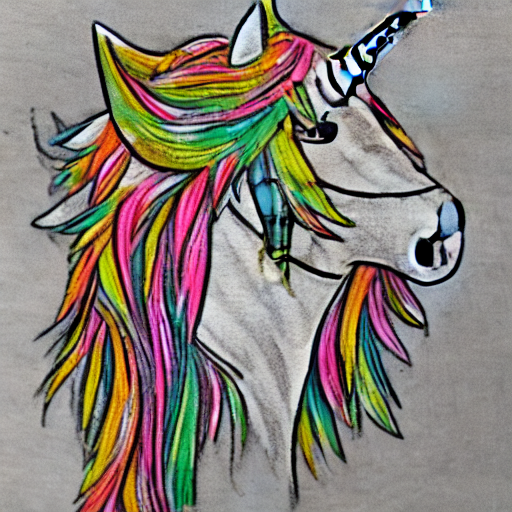

In [6]:
g = torch.Generator().manual_seed(SEED)
baseline = model.pipeline(
    prompt=[PROMPT],  # explicit kwarg avoids img2img dispatch
    num_inference_steps=N_STEPS,
    generator=g,
).images[0]
baseline

## 5 — Per-head scaling via `run_with_hooks`

In [7]:
def make_head_scale_hook(n_heads, head_idx, factor, start_step, end_step):
    """UNetAlterHook that scales a single attention head by *factor*."""

    def _policy(x: torch.Tensor, **_) -> torch.Tensor:
        orig_shape = x.shape  # (B, S, H*D)
        S = x.shape[-2]
        hs = x.view(x.shape[0], S, n_heads, -1).clone()  # (B, S, H, D)
        hs[..., head_idx, :] *= factor
        return hs.view(orig_shape)

    return UNetAlterHook(policy=_policy, step_index=slice(start_step, end_step))


def run_head_intervention(
    model, acc, head_idx, factor, start_step, end_step, prompt, n_steps, seed
):
    hook = make_head_scale_hook(
        n_heads=acc.module.heads,
        head_idx=head_idx,
        factor=factor,
        start_step=start_step,
        end_step=end_step,
    )
    # Use CPU generator (same RNG algorithm as baseline) so images are comparable
    g = torch.Generator().manual_seed(seed)
    return model.run_with_hooks(
        [prompt],
        hooks={acc.module: hook},
        num_inference_steps=n_steps,
        generator=g,
    )


specs = [
    InferenceSpec(
        name=f"head_{h}",
        inference_fn=run_head_intervention,
        kwargs=dict(
            model=model,
            acc=target_acc,
            head_idx=h,
            factor=FACTOR,
            start_step=START_STEP,
            end_step=END_STEP,
            prompt=PROMPT,
            n_steps=N_STEPS,
            seed=SEED,
        ),
    )
    for h in head_list
]
print(f"{len(specs)} specs")

8 specs


### Run

In [8]:
out = [Inference(s).run_inference() for s in tqdm(specs)]

  0%|          | 0/8 [00:00<?, ?it/s]

 12%|█▎        | 1/8 [00:09<01:05,  9.35s/it]

 25%|██▌       | 2/8 [00:21<01:05, 10.95s/it]

 38%|███▊      | 3/8 [00:33<00:57, 11.48s/it]

 50%|█████     | 4/8 [00:45<00:47, 11.81s/it]

 62%|██████▎   | 5/8 [00:58<00:35, 11.96s/it]

 75%|███████▌  | 6/8 [01:10<00:24, 12.07s/it]

 88%|████████▊ | 7/8 [01:22<00:12, 12.01s/it]

100%|██████████| 8/8 [01:35<00:00, 12.26s/it]

100%|██████████| 8/8 [01:35<00:00, 11.88s/it]

## 6 — Visualise

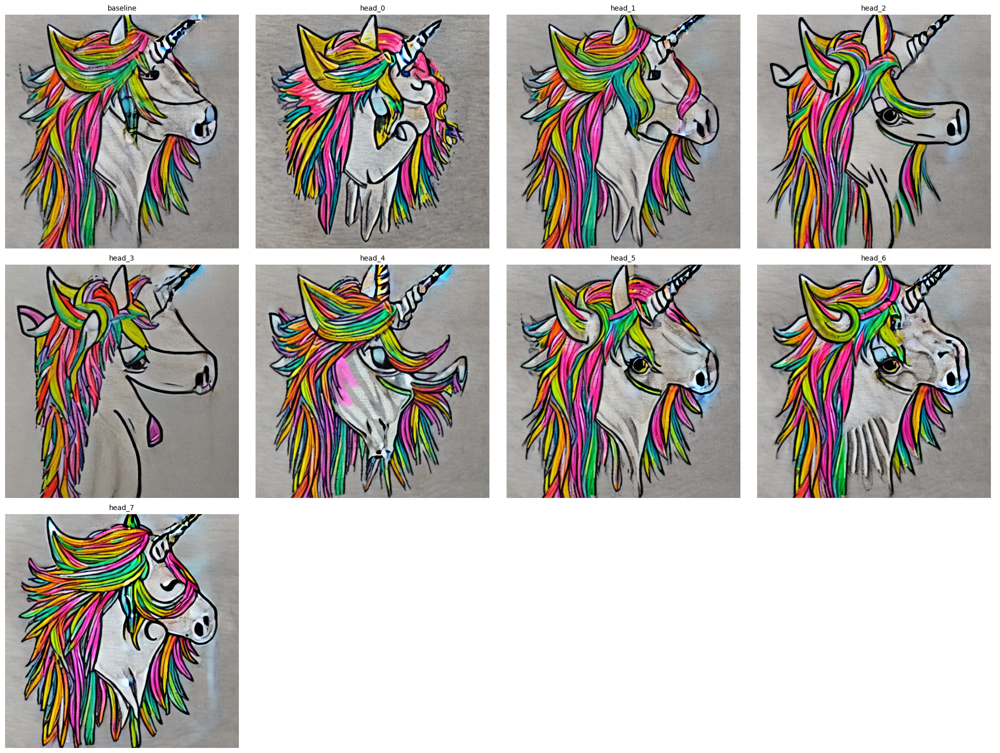

In [9]:
imgs = [baseline] + [o.preds[0] for o in out]
labels = ["baseline"] + [s.name for s in specs]
show_grid(imgs, labels, cols=min(4, len(imgs)))

## 7 — Multi-layer sweep (optional)

Total specs across all layers: 16


  0%|          | 0/16 [00:00<?, ?it/s]

  6%|▋         | 1/16 [00:11<02:53, 11.56s/it]

 12%|█▎        | 2/16 [00:22<02:36, 11.19s/it]

 19%|█▉        | 3/16 [00:33<02:21, 10.89s/it]

 25%|██▌       | 4/16 [00:47<02:26, 12.18s/it]

 31%|███▏      | 5/16 [01:01<02:24, 13.12s/it]

 38%|███▊      | 6/16 [01:14<02:10, 13.00s/it]

 44%|████▍     | 7/16 [01:27<01:55, 12.80s/it]

 50%|█████     | 8/16 [01:38<01:40, 12.50s/it]

 56%|█████▋    | 9/16 [01:51<01:27, 12.47s/it]

 62%|██████▎   | 10/16 [02:03<01:13, 12.29s/it]

 69%|██████▉   | 11/16 [02:15<01:01, 12.29s/it]

 75%|███████▌  | 12/16 [02:27<00:48, 12.22s/it]

 81%|████████▏ | 13/16 [02:39<00:36, 12.20s/it]

 88%|████████▊ | 14/16 [02:51<00:24, 12.18s/it]

 94%|█████████▍| 15/16 [03:03<00:12, 12.14s/it]

100%|██████████| 16/16 [03:16<00:00, 12.14s/it]

100%|██████████| 16/16 [03:16<00:00, 12.26s/it]


down_blocks_1_attentions_0_transformer_blocks_0_attn2_out


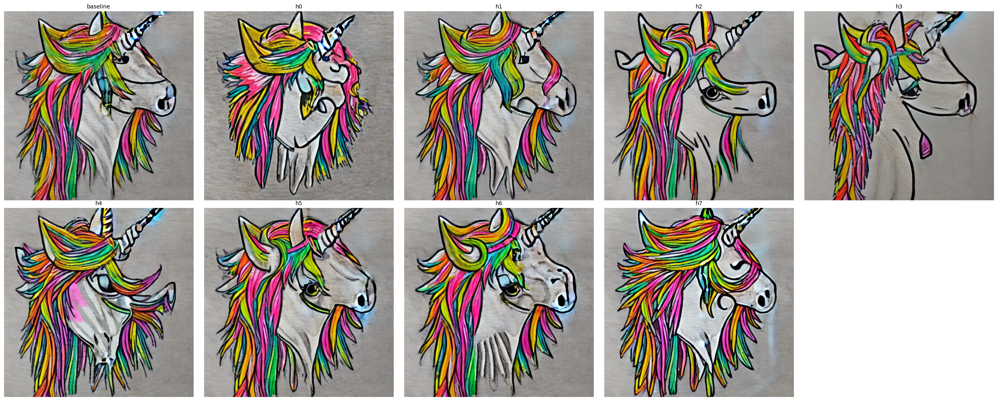


mid_block_attentions_0_transformer_blocks_0_attn2_out


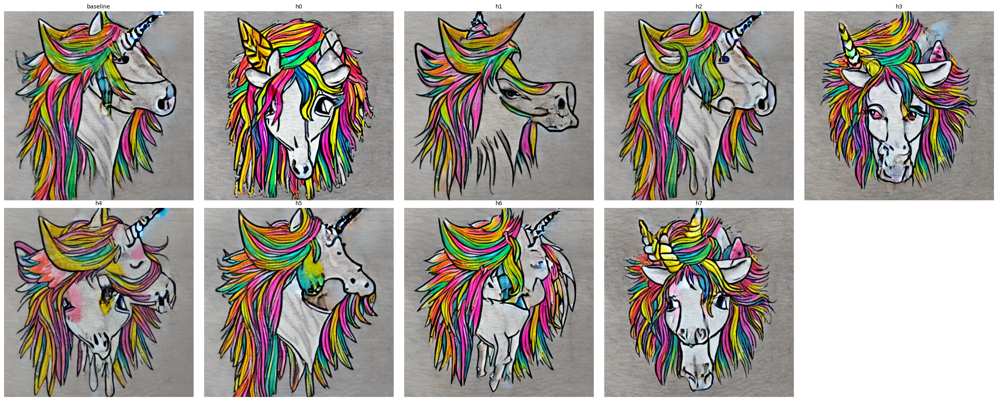

In [10]:
# Sweep every (layer, head) — only layers whose module actually has heads
QUICK_LAYER_FILTER = ["down_blocks.1.attentions.0", "mid_block.attentions.0", "up_blocks.0.attentions.0"]
multi_specs = [
    InferenceSpec(
        name=f"{name}__h{h}",
        inference_fn=run_head_intervention,
        kwargs=dict(
            model=model,
            acc=acc,
            head_idx=h,
            factor=FACTOR,
            start_step=START_STEP,
            end_step=END_STEP,
            prompt=PROMPT,
            n_steps=N_STEPS,
            seed=SEED,
        ),
    )
    for name, acc in all_cross_attn.items()
    if any(s.replace(".", "_") in name for s in QUICK_LAYER_FILTER)
    if getattr(acc.module, "heads", None)
    for h in range(acc.module.heads)
]
print(f"Total specs across all layers: {len(multi_specs)}")

multi_out = [Inference(s).run_inference() for s in tqdm(multi_specs)]

# Display: baseline + all intervened images grouped by layer

all_imgs = [baseline] + [o.preds[0] for o in multi_out]
all_labels = ["baseline"] + [s.name for s in multi_specs]

# Show per-layer grids
layer_names = sorted(
    set(name for name, acc in all_cross_attn.items() if any(s.replace(".", "_") in name for s in QUICK_LAYER_FILTER) if getattr(acc.module, "heads", None))
)
for layer in layer_names:
    layer_imgs = [baseline] + [
        o.preds[0] for o, s in zip(multi_out, multi_specs) if s.name.startswith(layer)
    ]
    layer_labels = ["baseline"] + [
        s.name.split("__")[1] for s in multi_specs if s.name.startswith(layer)
    ]
    print(f"\n{layer}")
    show_grid(layer_imgs, layer_labels, cols=min(5, len(layer_imgs)))

In [11]:
# Run fingerprint: writes a reproducibility record (model, dataset, intervention,
# git SHA, full config) to ./notebook_runs/localisation/fingerprint.json.
# Same machine-independent hash as the CLI workflow.
from t2i_interp.reporting.fingerprint import RunFingerprint
fp = RunFingerprint.from_cfg(
    cfg,
    workflow="localisation",
    intervention={"target_layer": cfg.get("target_layer"), "target_heads": list(cfg.get("target_heads") or []), "factor": cfg.get("factor"), "start_step": cfg.get("start_step"), "end_step": cfg.get("end_step")},
)
fp.write(f"./notebook_runs/localisation/fingerprint.json")
print(f"Fingerprint: {fp.hash()}  ({fp.workflow})")

Fingerprint: f3156850dadea8a2  (localisation)
